<a href="https://colab.research.google.com/github/phungthibacha/-OCR-MedDoc-Extracting-Data-from-Unstructured-Medical-Documents/blob/main/Project_Prescription_Document_and_Patient_Details_Document_Extraction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Install all the requirement modules for this project
# pdf to image conversion
%pip install pdf2image==1.10.0
!apt-get install poppler-utils
# image to text
%pip install pytesseract==0.3.0
# computer vision
%pip install opencv-python
# others
%pip install numpy
%pip install pandas
%pip install Pillow
%pip install "fastapi[all]"
import numpy as np
import pandas as pd

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
poppler-utils is already the newest version (22.02.0-2ubuntu0.3).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


Step 1: Transform pdf file to image

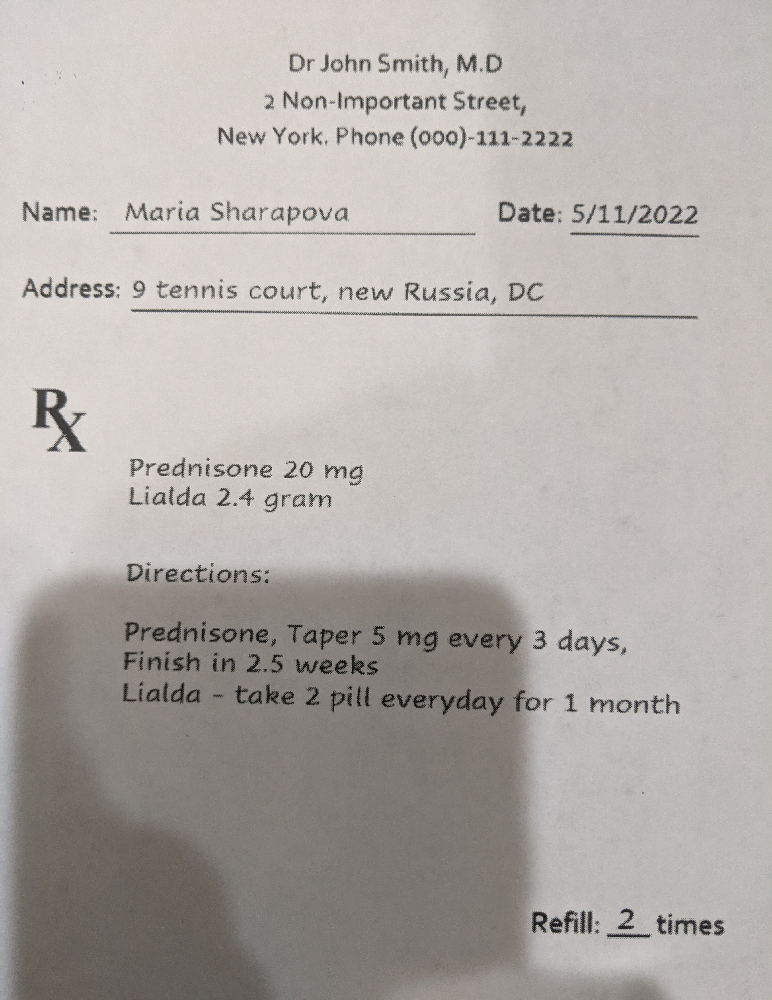

In [ ]:
from pdf2image import convert_from_path, convert_from_bytes
from IPython.display import display, Image

pages = convert_from_bytes(open('pre_1.pdf', 'rb').read(), size=2200)
display(pages[0])

In [ ]:
import pytesseract
!sudo apt install tesseract-ocr

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


In [ ]:
lang = 'eng'
config = r'--oem 3 --psm 6'
text = pytesseract.image_to_string(pages[0], lang = lang, config = config)
print(text)
# we should not perform pytesseract module on raw image,
#as it contains errors in dark area

, Dr John Smith, M.D
| 2 Non-Important Street,
New York, Phone (000)-111-2222
Name: Maria Sharapova Date: 5/11/2022
Address: 9 tennis court, new Russia, DC
errr
: Prednisone 20 mg
Lialda 2.4 gram
j 3 days,
| or 1 month
Refill: 2 times


Step 2: Using OpenCV to transform the image into clearer images - suitable for string extraction

Note: How thresholding works in OpenCV with examples

In [ ]:
# if pictures don't have lighting issues
# we make image more clearer by using simple thresholding

# if pictures have lighting issues, we divide image into different segments
# and instead of using global threshold, we use different threshold per region
# this technique is called Adaptive thresholding
import cv2
from PIL import Image

In [ ]:
img = cv2.imread("clear_image.jpg", flags = cv2.IMREAD_GRAYSCALE)
img

array([[206, 206, 206, ..., 185, 185, 185],
       [206, 206, 206, ..., 185, 185, 185],
       [206, 206, 206, ..., 186, 185, 185],
       ...,
       [207, 207, 207, ..., 191, 190, 190],
       [207, 207, 207, ..., 191, 190, 190],
       [207, 207, 207, ..., 191, 191, 190]], dtype=uint8)

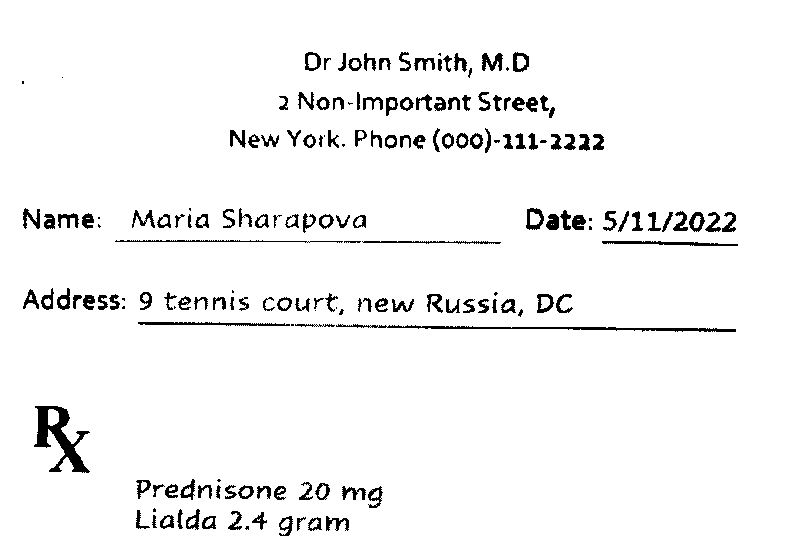

In [ ]:
#If picture is clear, we use simple threshold
_, new_img = cv2.threshold(img,150,255,cv2.THRESH_BINARY)
display(Image.fromarray(new_img))

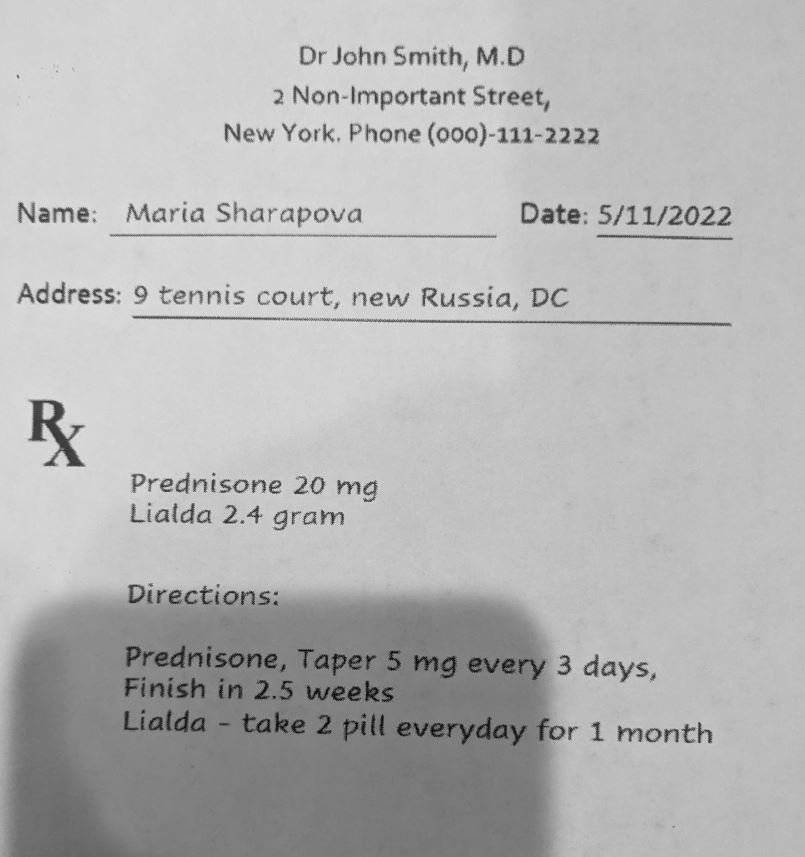

In [ ]:
img2 = cv2.imread("dark_image.jpg", flags = cv2.IMREAD_GRAYSCALE)
display(Image.fromarray(img2))

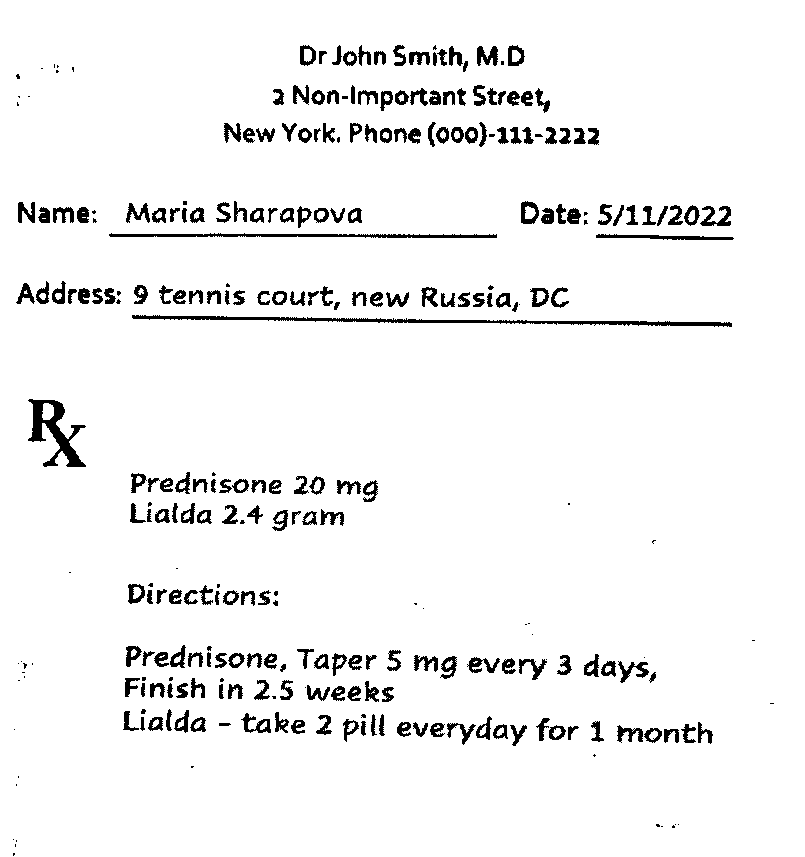

In [ ]:
#If the picture not clear, have lighting issue, we use Adaptive threshold
#The threshold now is calculated by gaussian weighted sum of the neighbourhood values minus constant C
#In this case, I try block size = 61, constant c = 11

new_img2 = cv2.adaptiveThreshold(
    img2, 255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY,
    61, 11
)
display(Image.fromarray(new_img2))

Back to the project

In [ ]:
#create a function to preprocessing the data
# (1)convert color image to gray image
# (2) zoom size bigger 1.5x
# (3) use adative threshold to make image clearer
def preprocess_image(img):
  gray = cv2.cvtColor(np.array(img), cv2.COLOR_BGR2GRAY) #convert color image to gray
  resized = cv2.resize(gray, None,fx = 1.5, fy=1.5, interpolation=cv2.INTER_LINEAR ) #zoom the image a little bigger
  processed_image = cv2.adaptiveThreshold(
    resized, 255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY,
    61, 11
)
  return processed_image

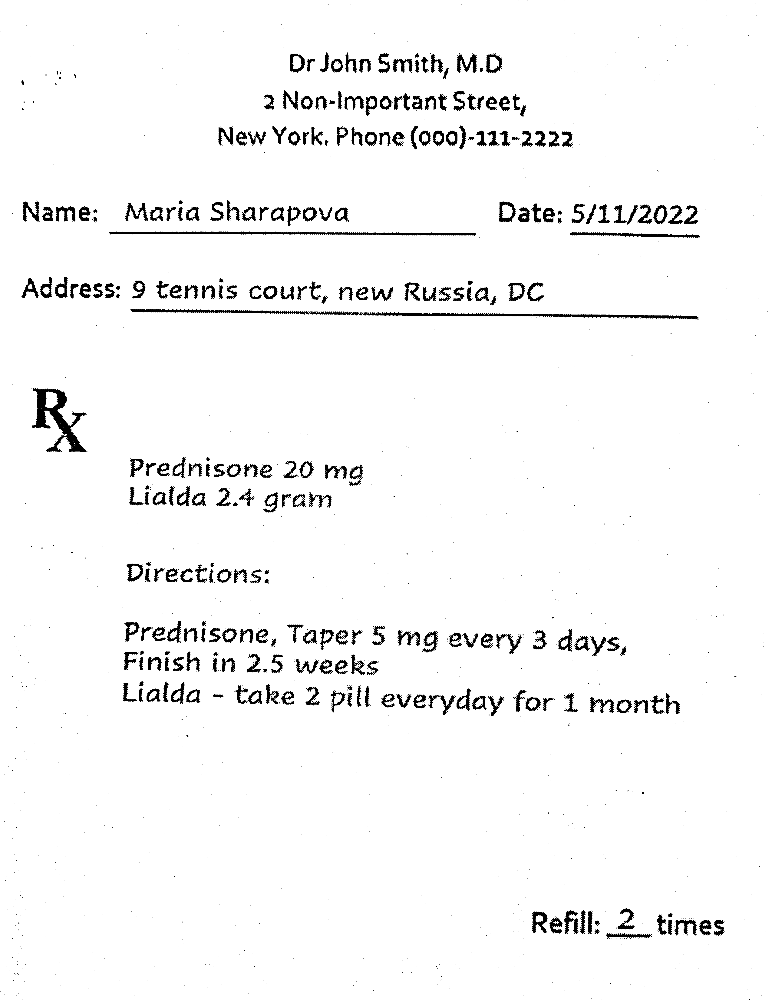

In [ ]:
post_img = preprocess_image(pages[0])
display(Image.fromarray(post_img))

Step 3: Extract string from image

In [ ]:
lang = 'eng'
config = r'--oem 3 --psm 6'
text = pytesseract.image_to_string(post_img, lang = lang, config = config)
print(text)

. Dr John Smith, M.D Loe
Be 2 Non-Important Street,
New York, Phone (000)-121-2222
Name: Marta Sharapova Date: 5/11/2022
Address: 9 tennis court, new Russia, DC
Prednisone 20 mg | | |
Lialda 2.4 gram : a
Directions: a
| Prednisone, Taper 5 mg every 3 days, |
Finish in 2.5 weeks
| Lialda - take 2 pill everyday for 1 month
: : 7 Refill: 2 times |


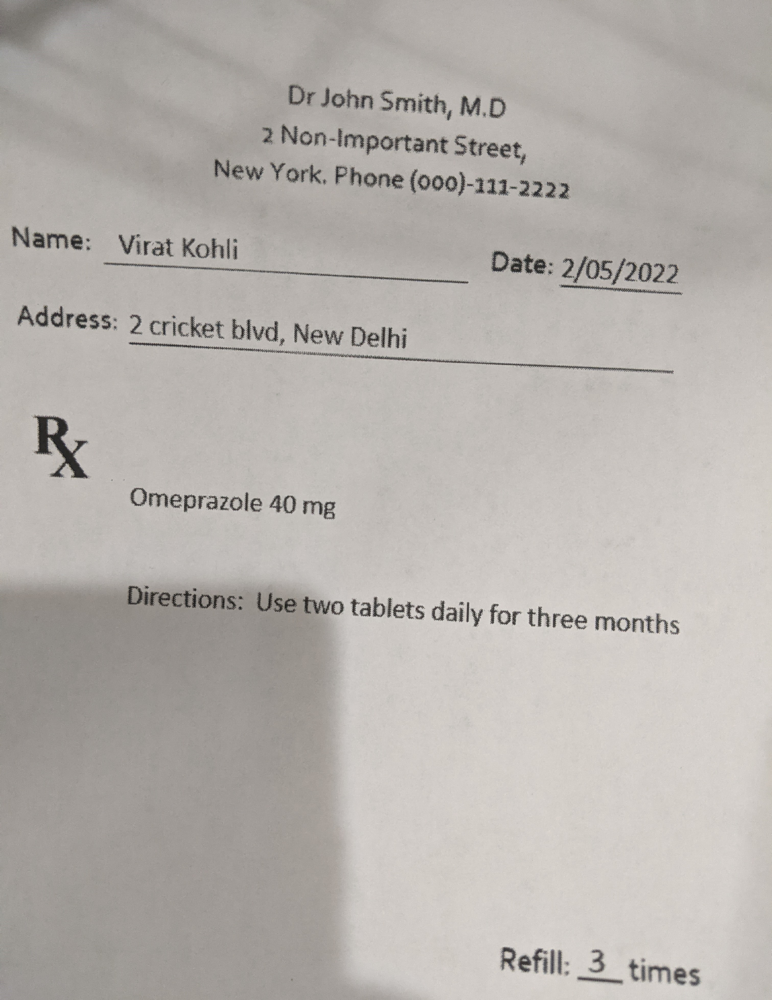

In [ ]:
#we try with other pictures
page2 = convert_from_bytes(open('pre_2.pdf', 'rb').read(), size=2200)
display(page2[0])

In [ ]:
post_img2 = preprocess_image(page2[0])
lang = 'eng'
config = r'--oem 3 --psm 6'
text2 = pytesseract.image_to_string(post_img2, lang = lang, config = config)
print(text2)

oo Dr John Smith, M.D
2 Non-Important street, oe
| New York, Phone (900)-211-2222 |
Name:  Virat Kohli Date: 2/05/2022
Address: 2 cricket blvd, New Delhi ee
—— Omeprazole 40 mg | |
Directions: Use two tablets daily for three months
Refill: 3 times


Step 4: Regular Expressions (Regex)

In [ ]:
# Regex helps pattern based information easier
%pip install regex
import re

In [ ]:
#First, let's have a look of 2 texts we extract from image
print(text)

. Dr John Smith, M.D Loe
Be 2 Non-Important Street,
New York, Phone (000)-121-2222
Name: Marta Sharapova Date: 5/11/2022
Address: 9 tennis court, new Russia, DC
Prednisone 20 mg | | |
Lialda 2.4 gram : a
Directions: a
| Prednisone, Taper 5 mg every 3 days, |
Finish in 2.5 weeks
| Lialda - take 2 pill everyday for 1 month
: : 7 Refill: 2 times |


In [ ]:
print(text2)

oo Dr John Smith, M.D
2 Non-Important street, oe
| New York, Phone (900)-211-2222 |
Name:  Virat Kohli Date: 2/05/2022
Address: 2 cricket blvd, New Delhi ee
—— Omeprazole 40 mg | |
Directions: Use two tablets daily for three months
Refill: 3 times


In [ ]:
#Extract patient name:
pattern_name = "Name:(.*)Date"
match = re.findall(pattern_name, text)
match[0].strip() #remove any leading or trailing whitespace

'Marta Sharapova'

In [ ]:
# Extract address:
pattern_address = "Address:(.*)\n"
match = re.findall(pattern_address, text)
match[0].strip() #remove any leading or trailing whitespace

'9 tennis court, new Russia, DC'

In [ ]:
#Extract medicine
pattern_medicine = "Address:[^\n]*(.*)Directions"
match = re.findall(pattern_medicine, text, flags=re.DOTALL)
print(match[0].strip()) #remove any leading or trailing whitespace

Prednisone 20 mg | | |
Lialda 2.4 gram : a


In [ ]:
#Extract directions to use medicine:
pattern_directions = "Directions:(.*)Refill"
match = re.findall(pattern_directions, text, flags=re.DOTALL)
print(match[0].strip()) #remove any leading or trailing whitespace

a
| Prednisone, Taper 5 mg every 3 days, |
Finish in 2.5 weeks
| Lialda - take 2 pill everyday for 1 month
: : 7


In [ ]:
#Extract refill - find how many times the medicine has to be refill:
pattern_refill = "Refill:(.*)times"
match = re.findall(pattern_refill, text, flags=re.DOTALL)
print(match[0].strip()) #remove any leading or trailing whitespace

2


In [ ]:
# Now I will have a look of patient detail documents
text = """
ie 47/12/2020 ot
° Patient Medical Record oe
. Patient Information Birth Date 4
Kathy Crawford May 6 1972
(737) 988-0851 Weight 7
9264 Ash Dr 95
New York City, 10005 + tage
United States Height:
190
| In Case of Emergency
ee oo
Simeone Crawford 9266 Ash Dr
" New York City, New York, 10005
Home phone United States
(990) 375-4621 Work phone
Genera! Medical History :
_
oe
Chicken Pox (Varicella): Meazies:
IMMUNE IMMUNE
Have you had the Hepatitis B vaccination?
No |
° Se
List any Medical Problems (asthma, seizures, headaches}:
Migraine
"""

In [ ]:
def remove_noise_extract_name_birthday(name):
  name = name.strip()
  filter = "[^0-9](.*)"
  name = re.findall(filter, name, flags=re.DOTALL)
  name = name[0].strip() #remove any leading or trailing whitespace
  #Birthday extraction
  birthday_pattern = '((Jan|Feb|Mar|Apr|May|Jun|Jul|Aug|Sep|Oct|Nov|Dec) [ \d]+)'
  birthday_matches = re.findall(birthday_pattern, name)
  if birthday_matches:
    birthday = birthday_matches[0][0]
    #Patient name extraction
    patient_name = name.replace(birthday, "").strip()
    return patient_name, birthday
patient_name, birthday = remove_noise_extract_name_birthday(name)
patient_name, birthday

('Kathy Crawford', 'May 6 1972')

In [ ]:
#Extract patient name and birthday:
pattern_name = "Birth Date(.*?)\(\d{3}\)"
name = re.findall(pattern_name, text, flags=re.DOTALL)
name = name[0]
patient_name, birthday = remove_noise_extract_name_birthday(name)
patient_name, birthday


('Kathy Crawford', 'May 6 1972')

In [ ]:
#Extract phone number:
pattern_phone = "Patient Information(.*?)(\(\d{3}\) \d{3}-\d{4})"
match = re.findall(pattern_phone, text, flags=re.DOTALL)
match[0][1]

'(737) 988-0851'

In [ ]:
#Extract vaccine information:
pattern_vaccine = "Have you had the Hepatitis B vaccination\?.*(No|Yes)"
match = re.findall(pattern_vaccine, text,  flags=re.DOTALL)
match[0].strip() #remove any leading or trailing whitespace

'No'

In [ ]:
#Extract medical problems:
pattern_medical_probs = "List any Medical Problems \(asthma, seizures, headaches[\}|[\)]:(.*)"
match = re.findall(pattern_medical_probs, text, flags=re.DOTALL)
match[0].strip() #remove any leading or trailing whitespace

'Migraine'